In [24]:
%reload_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from bleachbench.utils import config

In [2]:
# import label data
target_fp = config.bleaching_dir / "processed" / "reef_points.csv"
target_df = pd.read_csv(target_fp)
target_df.head(2)

,record_id,country,location,site_name,latitude,longitude,day,month,year,depth,...,mean_percent_mortality,severity_code,mortality_code,name,entry_code,database_code,bleach_presence,geometry,index_right,mmm_i
0,112043,Brazil,Manoa 1,NaN,-5.39000,-35.255,NaN,5.0,2010,"(2.0, 2.0)",...,NaN,NaN,NaN,NaN,NaN,NaN,1,POINT (-35.255 -5.39),388,2.0
1,112044,Brazil,Manoa 2,NaN,-5.38972,-35.255,NaN,5.0,2010,"(2.0, 2.0)",...,NaN,NaN,NaN,NaN,NaN,NaN,1,POINT (-35.255 -5.38972),388,2.0


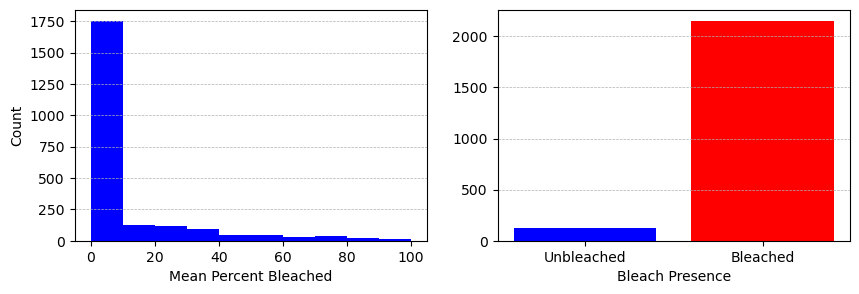

In [3]:
### visualise target
fig, (ax_hist, ax_bar) = plt.subplots(1, 2, figsize=(10, 3))
# continuous
ax_hist.hist(target_df["mean_percent_bleached"], bins=10, color="blue")
ax_hist.set_xlabel("Mean Percent Bleached")
ax_hist.set_ylabel("Count")
# binary
ax_bar.bar([1, 0], target_df["bleach_presence"].value_counts().values, color=["red", "blue"])
ax_bar.set_xlabel("Bleach Presence")
ax_bar.set_xticks([0, 1])
ax_bar.set_xticklabels(["Unbleached", "Bleached"])

for ax in [ax_hist, ax_bar]:
    ax.grid(axis='y', linestyle='--', linewidth=0.5)

In [4]:
### balance target with non-bleached points

from bleachbench.processing import processing

df = processing.process_bleaching_dataframe(verbose=True, steps=None)

Starting with 40681 observations

Filtering essential NaNs...
After essential_nans: 39452 observations

Filtering bleaching NaNs...
After bleaching_nans: 33185 observations

Sampling data...
After determine_mmm: 33185 observations

Filtering missing SST data...
Removed 1943 points where mmm_i is nan
After filter_missing_sst_data: 31242 observations

Adding bleaching presence labels...
After bleach_labels: 31242 observations

Filtering years after 2017...
After years_2017: 30950 observations

Filtering years with <100 observations...
Removed 155 observations due to insufficient yearly data
After years_obs_count: 30795 observations


Final dataset: 30795 observations


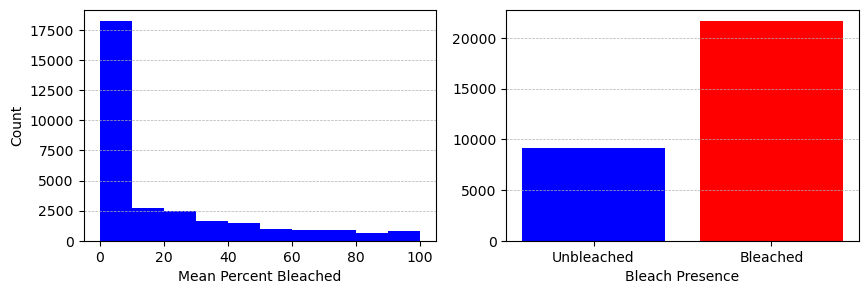

In [5]:
### visualise target
fig, (ax_hist, ax_bar) = plt.subplots(1, 2, figsize=(10, 3))
# continuous
ax_hist.hist(df["mean_percent_bleached"], bins=10, color="blue")
ax_hist.set_xlabel("Mean Percent Bleached")
ax_hist.set_ylabel("Count")
# binary
ax_bar.bar([1, 0], df["bleach_presence"].value_counts().values, color=["red", "blue"])
ax_bar.set_xlabel("Bleach Presence")
ax_bar.set_xticks([0, 1])
ax_bar.set_xticklabels(["Unbleached", "Bleached"])

for ax in [ax_hist, ax_bar]:
    ax.grid(axis='y', linestyle='--', linewidth=0.5)

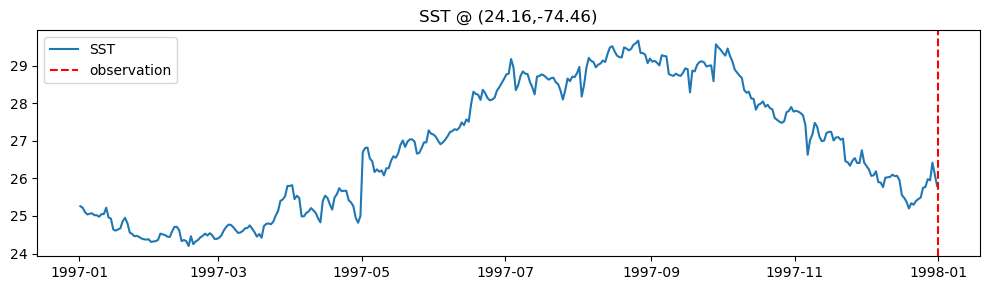

In [ ]:
from bleachbench.processing import loader

sst_loader = loader.SSTTimeSeriesLoader(df, window_days_before=365)
# sst_loader.__getitem__(100)
sst_loader.quick_plot(sst_loader.__getitem__(104))

In [ ]:
# get a sample of n timeseries and plot
n = 1000

import torch
# generate random indices
indices = np.random.randint(0, len(sst_loader), n)

sst_loader = loader.SSTTimeSeriesLoader(df, window_days_before=365)
from tqdm.auto import tqdm
tss = [sst_loader.__getitem__(i) for i in tqdm(indices, desc="Loading timeseries")]

Loading timeseries:   0%|          | 0/1000 [00:00<?, ?it/s]

Time window 2016-01-02 to 2017-01-01 not fully available for point (-13.09565306, 143.9781808). Missing years: ['2017']. Available years: ['1985', '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016']
Time window 2016-01-02 to 2017-01-01 not fully available for point (24.545, -81.41033). Missing years: ['2017']. Available years: ['1985', '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016']
Time window 2016-01-02 to 2017-01-01 not fully available for point (13.36565, 144.77179). Missing years: ['2017']. Available years: ['1985', '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995

In [70]:
tss

[{'sst': tensor([24.3000, 24.3500, 24.1400, 24.3000, 24.3900, 24.3200, 24.4700, 24.7400,
          24.6500, 24.1100, 24.2000, 24.3500, 24.2200, 24.1000, 24.1600, 24.4200,
          24.9300, 25.0600, 24.6800, 24.6300, 24.7600, 24.3600, 24.1500, 23.8700,
          23.8500, 24.0400, 24.0100, 23.9100, 23.8500, 24.0700, 24.0300, 24.4900,
          24.1500, 23.5800, 23.7400, 23.9100, 23.8400, 23.9700, 24.1500, 24.1800,
          24.5600, 24.4000, 24.8800, 24.7400, 24.7000, 24.8400, 25.0700, 24.7600,
          24.5000, 24.5100, 24.5900, 24.3700, 24.2600, 24.2100, 23.6600, 23.6200,
          23.5900, 23.5200, 23.4100, 23.5000, 23.8000, 23.8900, 23.9700, 24.0400,
          24.3300, 24.4300, 24.6800, 24.2100, 24.6800, 24.2200, 24.1500, 24.1700,
          24.3000, 24.1600, 24.2400, 24.5200, 24.5300, 24.6900, 24.6400, 24.6500,
          24.7900, 24.7900, 24.6500, 24.9500, 24.6100, 24.6200, 24.8500, 24.7300,
          24.5600, 24.8100, 25.0000, 24.4100, 24.3800, 24.3700, 24.4900, 24.7500,
         

In [73]:
pd.DataFrame(
    {
        "sst": [ts["sst"].cpu().numpy() if torch is not None and isinstance(ts["sst"], torch.Tensor) else ts["sst"] for ts in tss if ts is not None],
        "mean_percent_bleached": [ts.get("mean_percent_bleached") for ts in tss if ts is not None],
        "latitude": [ts.get("latitude") for ts in tss if ts is not None],
        "longitude": [ts.get("longitude") for ts in tss if ts is not None],
        "date": [ts.get("date") for ts in tss if ts is not None],
        "time": [ts.get("time") for ts in tss if ts is not None],
    }
)

,sst,mean_percent_bleached,latitude,longitude,date,time
0,"[24.3, 24.35, 24.14, 24.3, 24.39, 24.32, 24.47...",0.000000,None,None,2005-01-01,"DatetimeIndex(['2004-01-02 12:00:00', '2004-01..."
1,"[28.03, 27.91, 28.08, 28.13, 28.11, 28.07, 27....",5.500000,None,None,2016-01-01,"DatetimeIndex(['2015-01-01 12:00:00', '2015-01..."
2,"[27.39, 27.43, 27.13, 26.98, 26.96, 26.99, 27....",7.185941,None,None,2002-01-01,"DatetimeIndex(['2001-01-01 12:00:00', '2001-01..."
3,"[26.56, 26.61, 26.45, 26.54, 26.25, 26.39, 26....",23.500000,None,None,2005-01-01,"DatetimeIndex(['2004-01-02 12:00:00', '2004-01..."
4,"[26.26, 26.28, 26.14, 26.24, 26.37, 26.4, 26.2...",29.700000,None,None,2005-01-01,"DatetimeIndex(['2004-01-02 12:00:00', '2004-01..."
...,...,...,...,...,...,...
921,"[27.18, 27.12, 27.12, 27.07, 27.12, 27.03, 26....",6.620000,None,None,2006-01-01,"DatetimeIndex(['2005-01-01 12:00:00', '2005-01..."
922,"[29.27, 29.12, 28.82, 29.23, 29.23, 29.48, 29....",0.375000,None,None,2016-01-01,"DatetimeIndex(['2015-01-01 12:00:00', '2015-01..."
923,"[28.87, 28.88, 28.52, 28.86, 28.75, 28.73, 28....",5.000000,None,None,2015-01-01,"DatetimeIndex(['2014-01-01 12:00:00', '2014-01..."
924,"[23.95, 23.66, 23.37, 23.02, 23.59, 23.78, 23....",0.000000,None,None,2010-01-01,"DatetimeIndex(['2009-01-01 12:00:00', '2009-01..."


In [71]:
ts

{'sst': tensor([27.6200, 27.5600, 27.5300, 27.5000, 27.3100, 27.2500, 27.2500, 27.2600,
         27.2900, 27.2900, 27.2800, 27.1900, 27.1800, 27.1500, 27.1600, 27.1200,
         27.1200, 27.1200, 27.1400, 27.0400, 26.9200, 26.9000, 26.9000, 26.8400,
         26.7800, 26.7900, 26.9100, 26.8300, 26.9200, 26.9000, 26.8400, 26.7900,
         26.8100, 26.7800, 26.8500, 26.9000, 26.7600, 26.7200, 26.7400, 26.7400,
         26.8200, 26.7800, 26.8100, 26.7900, 26.8400, 26.8200, 26.9100, 26.9100,
         26.9100, 26.8200, 26.8400, 26.8000, 26.8900, 26.8600, 26.8400, 26.9400,
         26.9600, 26.9200, 26.9200, 26.8400, 26.8600, 26.8200, 26.7000, 26.8300,
         26.9400, 26.8800, 26.6800, 26.6800, 26.7700, 26.8500, 26.8400, 26.8800,
         26.9200, 26.9100, 26.9500, 26.9800, 26.9100, 26.9200, 26.8600, 26.9200,
         26.7200, 26.8700, 26.8600, 27.0100, 27.0100, 27.0900, 26.9900, 27.0700,
         27.1900, 27.1300, 26.9100, 26.7900, 26.7200, 26.8200, 27.0500, 27.1200,
         27.3000, 27.

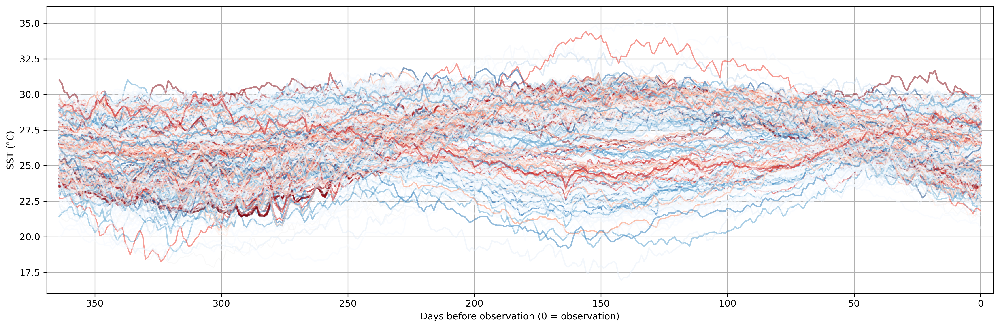

In [ ]:
import matplotlib

# Plot timeseries of ssts, coloured by mean_percent_bleached range
fig, ax = plt.subplots(figsize=(15, 5), dpi=300)

blues_cmap = matplotlib.colormaps.get_cmap("Blues")
reds_cmap = matplotlib.colormaps.get_cmap("Reds")

# cast ts values into a dataframe for easier plotting
ts_df = pd.DataFrame(tss)

for ts in filter(None, tss):
    sst = ts["sst"].cpu().numpy() if torch is not None and isinstance(ts["sst"], torch.Tensor) else ts["sst"]
    mpb = ts.get("mean_percent_bleached")

    # Set defaults
    color, alpha, linewidth = "black", 0.5, 1.0

    if mpb is not None:
        try:
            mpb_val = float(mpb)
        except (TypeError, ValueError):
            mpb_val = None

        if mpb_val is not None:
            if 0 <= mpb_val < 10:
                color = blues_cmap(mpb_val / 10.0)
                linewidth = 1.5
            elif 10 <= mpb_val < 20:
                color = (0.8, 0.8, 0.8, 0.2)  # very light grey, low opacity
                alpha = 0.1
            elif 20 <= mpb_val <= 100:
                norm_mpb = min(max((mpb_val - 20) / 80.0, 0), 1)
                color = reds_cmap(norm_mpb)
                linewidth = 1.7 if mpb_val > 80 else 1.3

    # x axis: days_before runs from 365 on the left (oldest), to 0 on right (observation)
    days_before = np.arange(len(sst)-1, -1, -1)  # e.g. [364, ..., 0] if 365 days
    ax.plot(days_before, sst, color=color, alpha=alpha, linewidth=linewidth)

ax.set_xlabel("Days before observation (0 = observation)")
ax.set_ylabel("SST (°C)")

# Set x-ticks to show 365 on left, 0 on right
xticks = ax.get_xticks()
xticks = xticks[(xticks >= 0) & (xticks <= np.max(days_before))]
ax.set_xticks(xticks)
ax.set_xticklabels([str(int(tick)) for tick in xticks])

plot_buffer = 5
ax.set_xlim(np.max(days_before)+plot_buffer, -plot_buffer)
ax.grid(True)
plt.tight_layout()